In [1]:
import rioxarray as rx
import xarray as xr
import seaborn as sns
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import joblib
import contextily as cx
plt.rcParams['figure.figsize'] = (8,6)
plt.rcParams['figure.dpi'] = 200
plt.rcParams['font.family'] = ['Times New Roman + SimSun + Nowar Sans GB18030', ]  # 设置字体 simhei, Heiti TC
font_name = "Times New Roman + SimSun + Nowar Sans GB18030"

In [2]:
import geopandas as gpd
from rasterstats import zonal_stats
import rasterio
import northarrow_new

In [3]:
import os
os.chdir(r"/Volumes/2TMyRes/SynologyDrive/SCI/BeijingHeatExposure")

# Basic data

In [4]:
region = './边界数据/研究区/五环.shp'
region = gpd.read_file(region)

In [5]:
parks = gpd.read_file('./公园与住宅数据/北京市-parks-from-osm-more-than-10k.geojson')

In [6]:
ring2 = gpd.read_file('./边界数据/北京六环/二环.shp')
ring3 = gpd.read_file('./边界数据/北京六环/三环.shp')
ring4 = gpd.read_file('./边界数据/北京六环/四环.shp')
ring5 = gpd.read_file('./边界数据/北京六环/五环.shp')

ring2 = ring2.to_crs(4326)
ring3 = ring3.to_crs(4326)
ring4 = ring4.to_crs(4326)

In [7]:
roads = gpd.read_file('./其他数据/roads.geojson')

In [8]:
# roads_5r.plot()

In [9]:
pop = gpd.read_file('./边界数据/beijing-town-with-pop.geojson')

In [10]:
center_l = gpd.read_file('./边界数据/POLYLINE/')

In [11]:
# pop

# Read data

In [12]:
%%time

utci = joblib.load('./UTCI/utci.joblib')
lines_gdf = gpd.read_file('./ODroutes/routes.geojson')
raster_path = "./UTCI/utci.tif"

# 计算每条线的栅格均值
# stats = zonal_stats(
#     vectors=lines_gdf,    # GeoDataFrame 或 GeoJSON
#     raster=raster_path,   # TIF 文件路径
#     stats=["mean"],       # 只计算均值
#     all_touched=True,      # True 表示栅格只要被线经过就计算
#     raster_out=True
# )

# import joblib
# joblib.dump(stats, './UTCI/routes_14w_utci.joblib')

stats = joblib.load('./UTCI/routes_14w_utci.joblib')

CPU times: user 5.45 s, sys: 677 ms, total: 6.13 s
Wall time: 7.13 s


In [13]:
lines_gdf[lines_gdf['od_id'] == 547380]

,od_id,geometry
19422,547380,"LINESTRING (116.53452 39.93371, 116.53478 39.9..."


<Axes: >

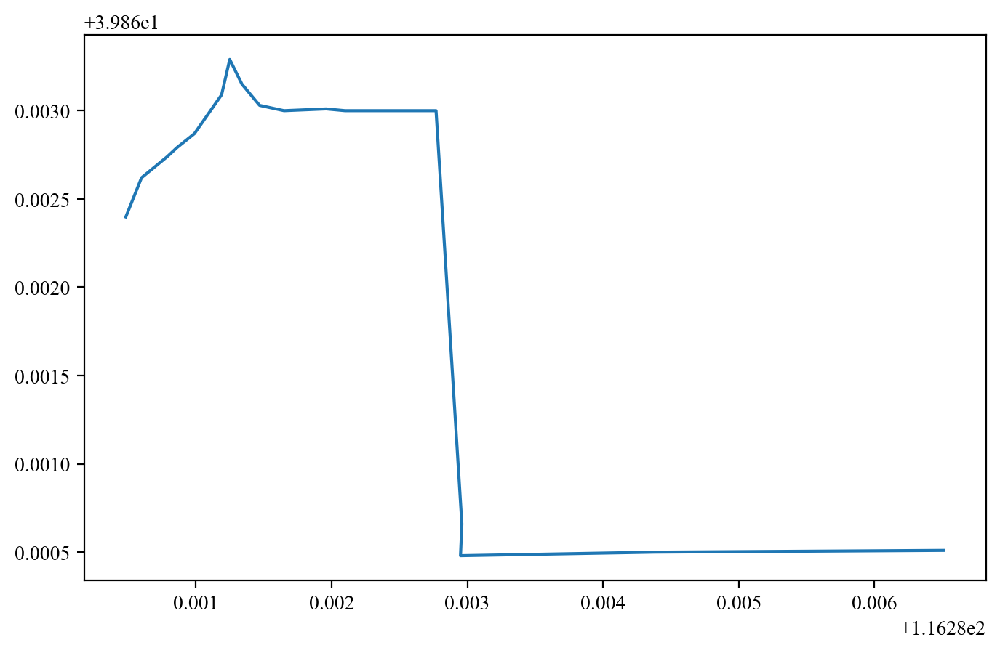

In [14]:
lines_gdf.head(1).plot()

In [15]:
cvt = [np.where(s['mini_raster_array'].mask, np.nan, True) for s in stats]
res = [cvt[i] * stats[i]['mini_raster_array'].data for i in range(len(stats))]

In [16]:
len(res) # 存储所有的路径像元

149070

In [17]:
sample1 = res[0]
sample2 = res[2]

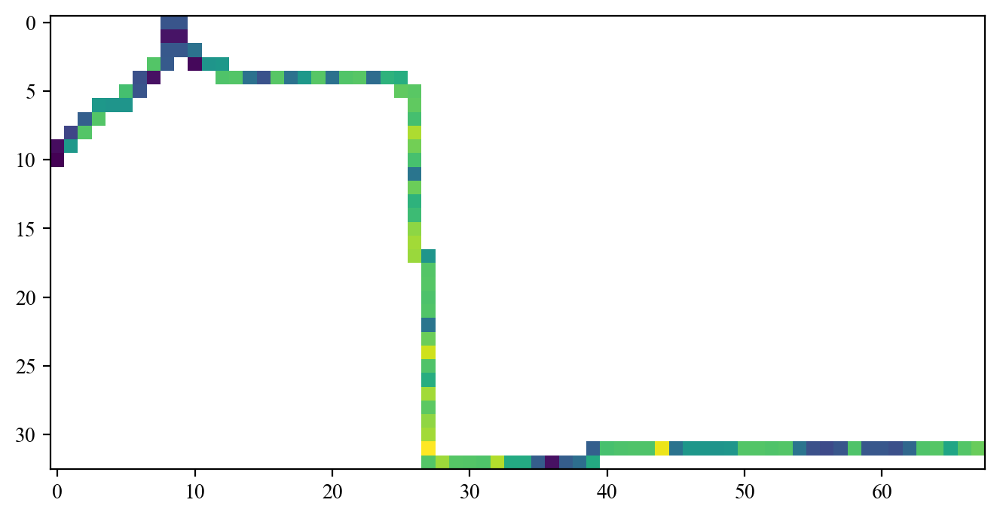

In [18]:
plt.imshow(sample1)

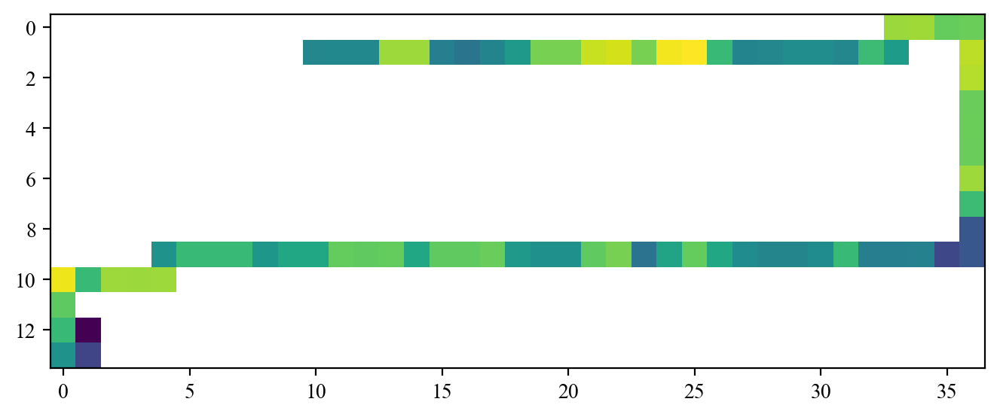

In [19]:
plt.imshow(sample2)

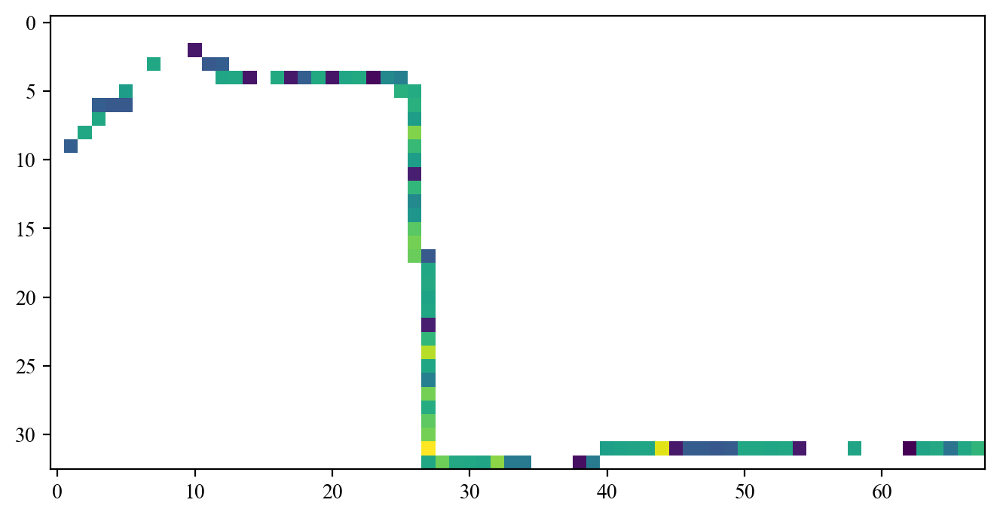

In [20]:
masked_data = np.where(sample1 > 32, sample1, np.nan)
plt.imshow(masked_data)

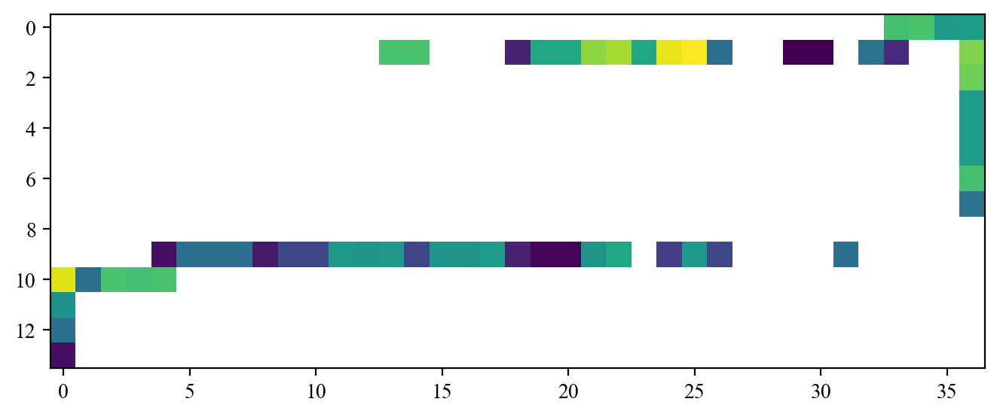

In [21]:
masked_data = np.where(sample2 > 32, sample2, np.nan)
plt.imshow(masked_data)

## SHSR

In [22]:
np.nansum(~np.isnan(sample1))

np.int64(111)

In [23]:
np.sum((sample1 > 32))

np.int64(85)

In [24]:
np.sum((sample1 > 32)) / np.nansum(~np.isnan(sample1))

np.float64(0.7657657657657657)

In [25]:
def cal_SHSR(dt):
    try:
        all_num = np.nansum(~np.isnan(dt))
        t_more_than_32 = np.sum(dt > 32)
        # print(all_num, t_more_than_32)
        ratio = t_more_than_32 / all_num
    except:
        ratio = np.nan
    return ratio

In [26]:
# cal_SHSR(sample1)

In [27]:
# %%time
# cal_SHSR(sample2)

In [28]:
# %%time
# SHSR = [cal_SHSR(dt) for dt in res] # 

## CEHL

In [29]:
masked_data = np.where(sample1 > 32, sample1, np.nan)
masked_data = masked_data - 32

In [30]:
masked_data

array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ..., 1.00236893, 1.51922226,
        1.65000153],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]])

In [31]:
vlx = [i for i in masked_data.flatten() if ~np.isnan(i)]

In [32]:
def cal_CEHL(dt):
    try:
        masked_data = np.where(dt > 32, dt, np.nan)
        masked_data = masked_data - 32
        vlx = np.array([i for i in masked_data.flatten() if ~np.isnan(i)])
        cehl = np.sum(vlx * 8 / 60)
    except:
        cehl = 0
    return cehl

In [33]:
# cal_CEHL(sample1)

# cal_CEHL(sample2)

# len(res)

# CEHL = [cal_CEHL(dt) for dt in res[:]] # 

## MCSHD

In [34]:
from scipy import ndimage

binary_mask = sample1 > 32
structure = np.ones((3, 3)) 
labeled_array, num_features = ndimage.label(binary_mask, structure=structure)

if num_features > 0:
    # 2. 统计每个标签出现的次数（即每个连通域的像元数量）
    # bincount 会统计从 0 到 max_label 的出现次数，0 是背景（不符合条件的点）
    area_counts = np.bincount(labeled_array.ravel())
    
    # 3. 忽略背景（索引 0），找到最大值的数量
    max_pixels = area_counts[1:].max()
    print(f"最大相邻像元块的数量为: {max_pixels}")
else:
    print("没有符合大于 32 条件的像元")

最大相邻像元块的数量为: 47


In [35]:
def cal_MCHSD(dt):
    try:
        binary_mask = dt > 32
        structure = np.ones((3, 3)) 
        labeled_array, num_features = ndimage.label(binary_mask, structure=structure)
        
        if num_features > 0:
            # 2. 统计每个标签出现的次数（即每个连通域的像元数量）
            # bincount 会统计从 0 到 max_label 的出现次数，0 是背景（不符合条件的点）
            area_counts = np.bincount(labeled_array.ravel())
            
            # 3. 忽略背景（索引 0），找到最大值的数量
            max_pixels = area_counts[1:].max()
            # print(f"最大相邻像元块的数量为: {max_pixels}")
            mcshd = (max_pixels * 8) / 60  # 像元之间按步行8秒算，然后转换为分钟
        else:
            # print("没有符合大于 32 条件的像元")
            mcshd = 0
    except:
        mcshd = np.nan
    return mcshd

In [36]:
# cal_MCHSD(sample1)

# cal_MCHSD(sample2)

# MCHSD = [cal_MCSHD(dt) for dt in res] # 

# HSI = [np.nanmean(dt) for dt in res] # 
# HSV = [np.nanstd(dt) for dt in res] # 

# # 将结果加入 GeoDataFrame
# lines_gdf["HSI"] = HSI
# lines_gdf["HSV"] = HSV
# lines_gdf["SHSR"] = SHSR
# lines_gdf["CEHL"] = CEHL
# lines_gdf["MCHSD"] = MCHSD

# lines_gdf2 = lines_gdf.dropna()
# lines_gdf2 = lines_gdf2[lines_gdf2['HSI'] > 27]

# lines_gdf2.sort_values(by='HSI')

# lines_gdf2.to_file("./ODroutes/routes-with-utci.geojson")

# Merge to OD data

In [37]:
lines_gdf2 = gpd.read_file("./ODroutes/routes-with-utci.geojson")

In [38]:
lines_gdf2.head(1)

,od_id,HSI,HSV,SHSR,CEHL,MCHSD,geometry
0,258315,32.895993,0.87438,0.765766,14.578293,6.266667,"LINESTRING (116.28652 39.86051, 116.28438 39.8..."


In [39]:
import joblib

df_od = joblib.load('./OD数据相关/od_to_request.joblib')

In [40]:
df_od.head(1)

,name_x,pid,geometry_x,park_lng,park_lat,ix,floors,rid_b,geometry_y,name_y,price,building_lng,building_lat,distance,od_id
90,建国门健身乐园,0,"POLYGON ((116.42728 39.90744, 116.42728 39.908...",116.427951,39.908352,1,2.0,762,"POLYGON ((116.40211 39.90987, 116.40211 39.909...",NaN,NaN,116.402127,39.909814,2208.556071,0


In [41]:
result = df_od.merge(lines_gdf2, on='od_id')

In [42]:
# result.explore()

In [43]:
# result = result.clip(region)

In [44]:
result.columns

Index(['name_x', 'pid', 'geometry_x', 'park_lng', 'park_lat', 'ix', 'floors',
       'rid_b', 'geometry_y', 'name_y', 'price', 'building_lng',
       'building_lat', 'distance', 'od_id', 'HSI', 'HSV', 'SHSR', 'CEHL',
       'MCHSD', 'geometry'],
      dtype='object')

In [45]:
building_utci = result[['floors',
       'rid_b', 'geometry_y',  'building_lng', 'building_lat',
       'distance', 'od_id',  'HSI', 'HSV', 'SHSR', 'CEHL',
       'MCHSD',]]

In [46]:
building_utci = building_utci.rename(columns={'geometry_y':'geometry'})

In [47]:
rt = pd.read_json('./ODroutes/routes_130w.json')

In [48]:
rt.head(1)

,duration,distance,path,od_id
0,2084.7,2595.7,"[[116.40259, 39.90983], [116.40259, 39.9098], ...",0


In [49]:
building_utci = building_utci.merge(rt[['duration', 'od_id']], on='od_id', how='left')

In [50]:
# building_utci.head().explore()

In [51]:
# building_utci.sort_values(by='HSI')

In [52]:
building_utci.drop_duplicates(subset='rid_b').head(1)

,floors,rid_b,geometry,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration
0,2.0,28000,"POLYGON ((116.4254 39.9122, 116.4254 39.91216,...",116.425493,39.912182,474.652818,23,32.872819,1.039166,0.723684,10.36197,3.066667,506.9


In [53]:
building_utci['expo_time'] = building_utci['duration'] * building_utci['SHSR']

In [54]:
building_utci.head(1)

,floors,rid_b,geometry,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration,expo_time
0,2.0,28000,"POLYGON ((116.4254 39.9122, 116.4254 39.91216,...",116.425493,39.912182,474.652818,23,32.872819,1.039166,0.723684,10.36197,3.066667,506.9,366.835526


In [55]:
building_utci.to_file('./UTCI/building_utci.geojson')

<Axes: >

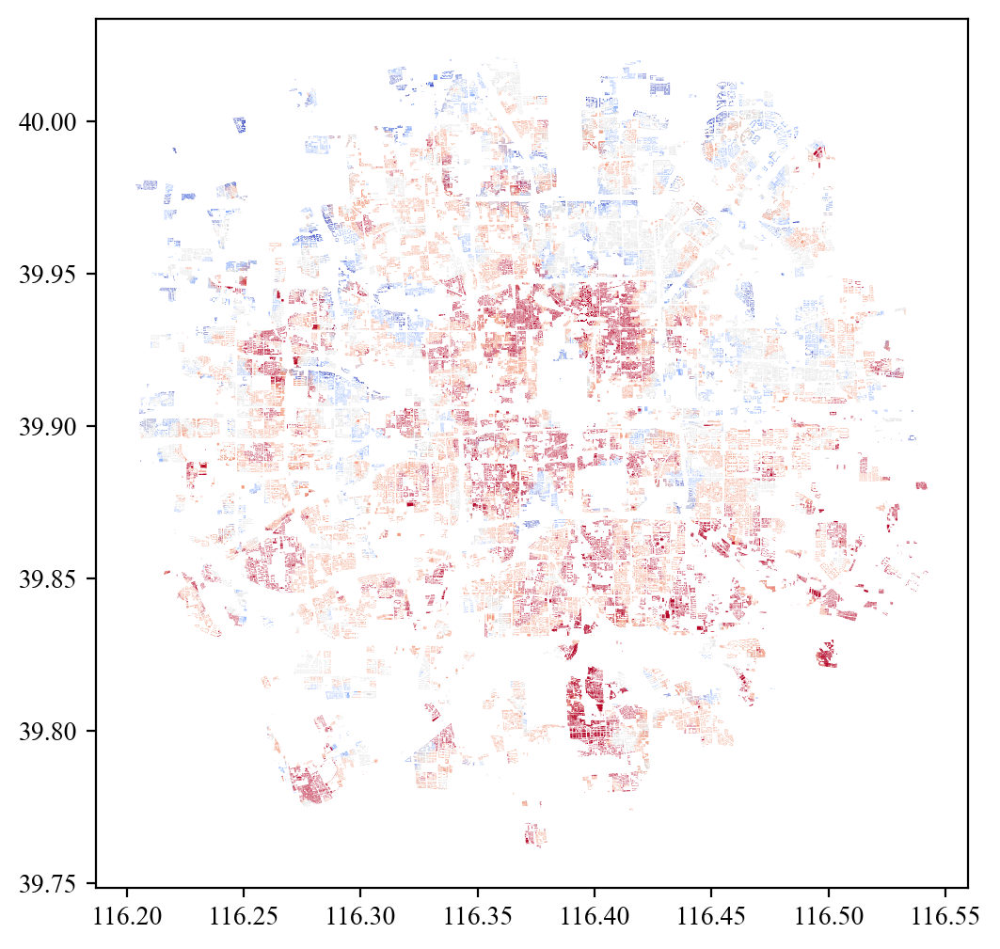

In [56]:
building_utci.plot(column='HSI', k=5,scheme='naturalbreaks',cmap='coolwarm', lw=0.2)

# Heat exposure in building scale 

In [57]:
dmean = building_utci['HSI'].mean().round(3)
dmedian = building_utci['HSI'].median()
dmax = building_utci['HSI'].max()
dmin = building_utci['HSI'].min()

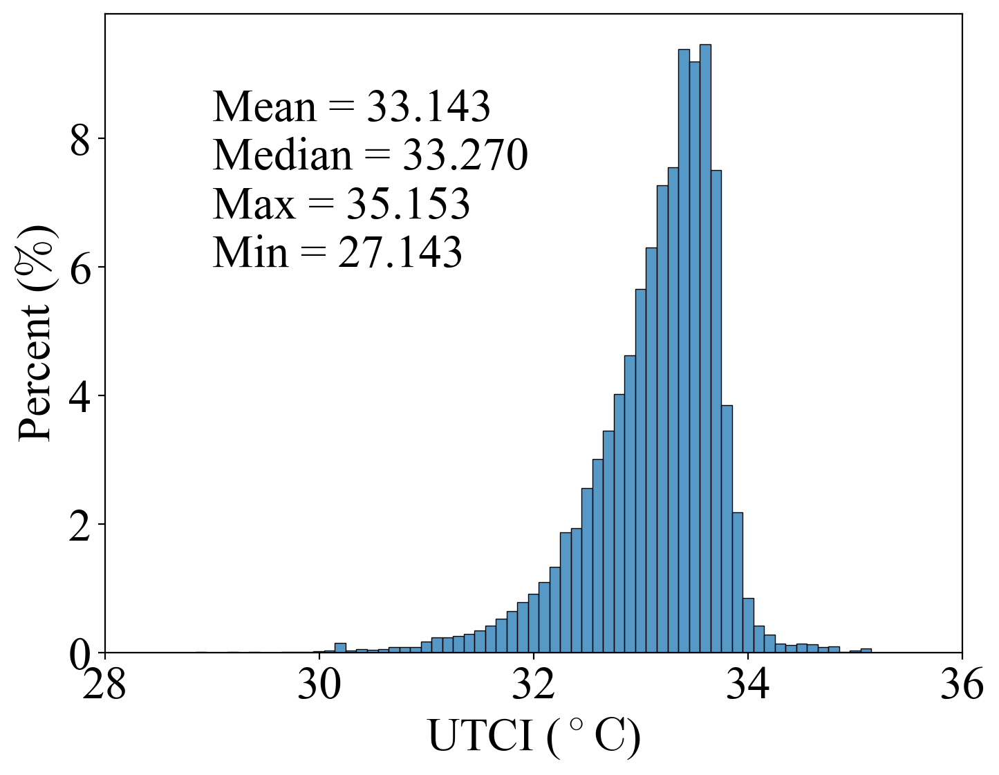

In [58]:
import seaborn as sns

fig, ax = plt.subplots()
sns.histplot(data=building_utci, x='HSI', stat='percent',binwidth=0.1, ax=ax)
ax.set_xlim(28,36)

fontsize = 24
ax.tick_params(axis='both', labelsize=fontsize)  # 设置 X 轴刻度标签的字体大小为 14 点
ax.set_xlabel("UTCI ($^\circ\mathrm{C}$)", fontsize=fontsize, math_fontfamily='cm', )
ax.set_ylabel("Percent ($\%$)", fontsize=fontsize, math_fontfamily='cm', )

ax.text(29,6,f'Mean = {dmean:.3f}\nMedian = {dmedian:.3f}\nMax = {dmax:.3f}\nMin = {dmin:.3f}',
        math_fontfamily='cm', fontsize=fontsize )

# plt.savefig(f'./SavedFig/02-utci-buildings-hist.png', bbox_inches='tight',dpi=300)
plt.show()

In [59]:
minx, miny, maxx, maxy = list(region.total_bounds)

## HSI

(np.float64(116.18470953985229),
 np.float64(116.56092769838358),
 np.float64(39.743367167787824),
 np.float64(40.03522638681255))

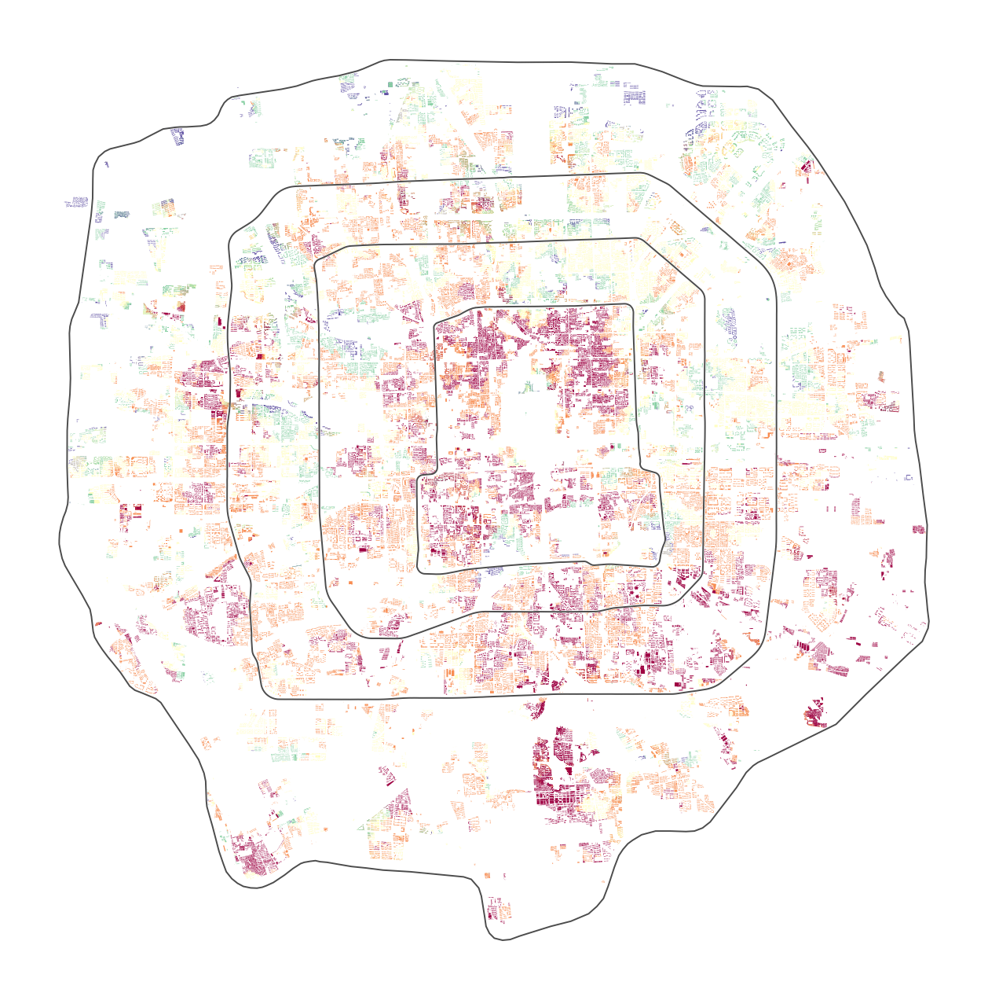

In [60]:
fig, ax = plt.subplots(figsize=(10,8))

lw = 0.7
alpha = 0.7
building_utci.plot(ax=ax, column='HSI', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=False,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
                  )
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
# center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)

# roads_5r.plot(ax=ax,facecolor='none', edgecolor='k', alpha=0.2, lw=0.1)
# ax.set(xlim=(minx, maxx), ylim=(miny, maxy))
# cx.add_basemap(ax, crs=building_utci.crs,alpha=0.3,
#                   source=cx.providers.MapBox.Streets,zorder=0)

# legend = ax.get_legend()
# legend.set_title("Legend\n($^\circ\mathregular{C}$)",)
# legend._legend_box.align = "left"


# lines = legend.get_lines()
# for line in lines:
#     line.set_marker('s')

# lines = legend.get_texts()
# for line in lines:
#     print(line)
#     rp = line.get_text().replace(', ', ' - ')
#     line.set_text(rp)

# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")
ax.axis('off')

# northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
#                                 sub=8, divd=6
#                                 )

# plt.savefig(f'./SavedFig/02-utci-buildings-spatial.png', bbox_inches='tight',dpi=300)

In [61]:
building_utci.columns

Index(['floors', 'rid_b', 'geometry', 'building_lng', 'building_lat',
       'distance', 'od_id', 'HSI', 'HSV', 'SHSR', 'CEHL', 'MCHSD', 'duration',
       'expo_time'],
      dtype='object')

## HSV

(np.float64(116.18470953985229),
 np.float64(116.56092769838358),
 np.float64(39.743367167787824),
 np.float64(40.03522638681255))

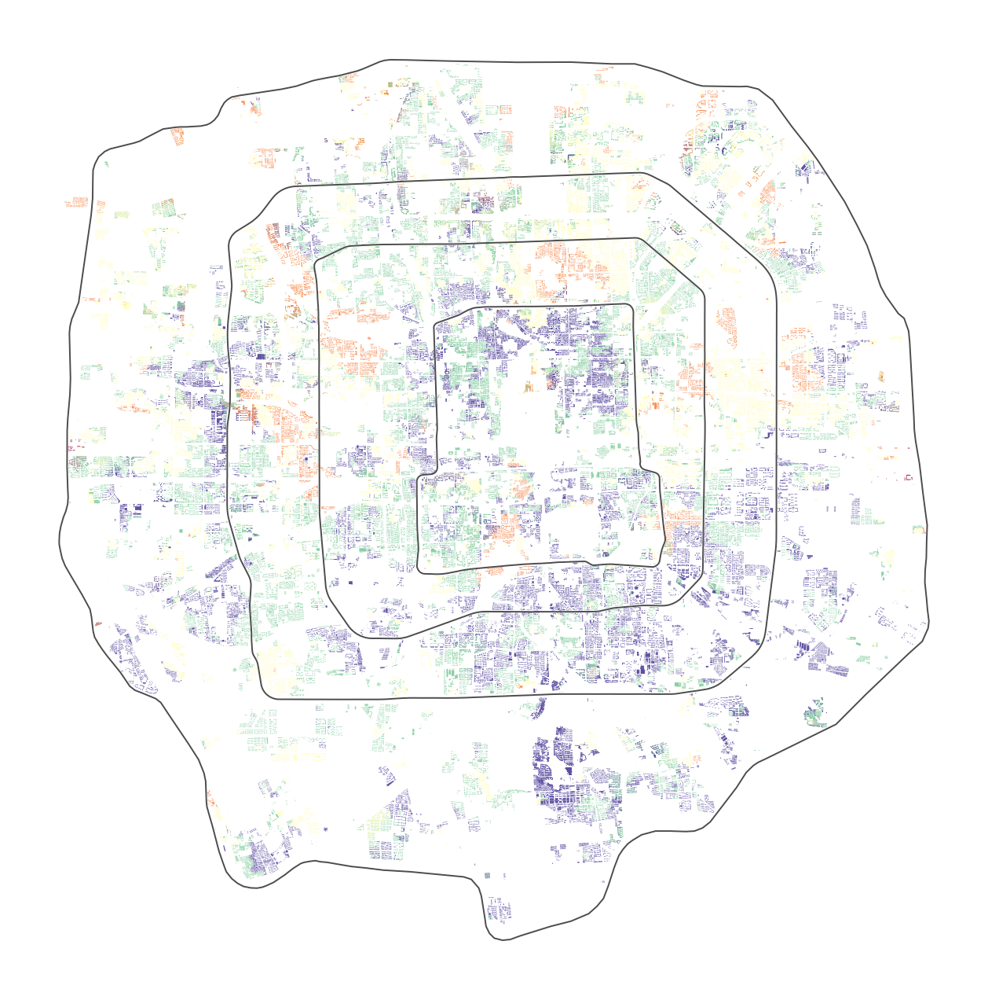

In [62]:
fig, ax = plt.subplots(figsize=(10,8))

lw = 0.7
alpha = 0.7
building_utci.plot(ax=ax, column='HSV', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=False,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
                  )
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
# center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)

# roads_5r.plot(ax=ax,facecolor='none', edgecolor='k', alpha=0.2, lw=0.1)
# ax.set(xlim=(minx, maxx), ylim=(miny, maxy))
# cx.add_basemap(ax, crs=building_utci.crs,alpha=0.3,
#                   source=cx.providers.MapBox.Streets,zorder=0)

# legend = ax.get_legend()
# legend.set_title("Legend\n($^\circ\mathregular{C}$)",)
# legend._legend_box.align = "left"


# lines = legend.get_lines()
# for line in lines:
#     line.set_marker('s')

# lines = legend.get_texts()
# for line in lines:
#     print(line)
#     rp = line.get_text().replace(', ', ' - ')
#     line.set_text(rp)

# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")
ax.axis('off')

# northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
#                                 sub=8, divd=6
#                                 )

# plt.savefig(f'./SavedFig/02-utci-buildings-HSV.png', bbox_inches='tight',dpi=300)

## SHSR

(np.float64(116.18470953985229),
 np.float64(116.56092769838358),
 np.float64(39.743367167787824),
 np.float64(40.03522638681255))

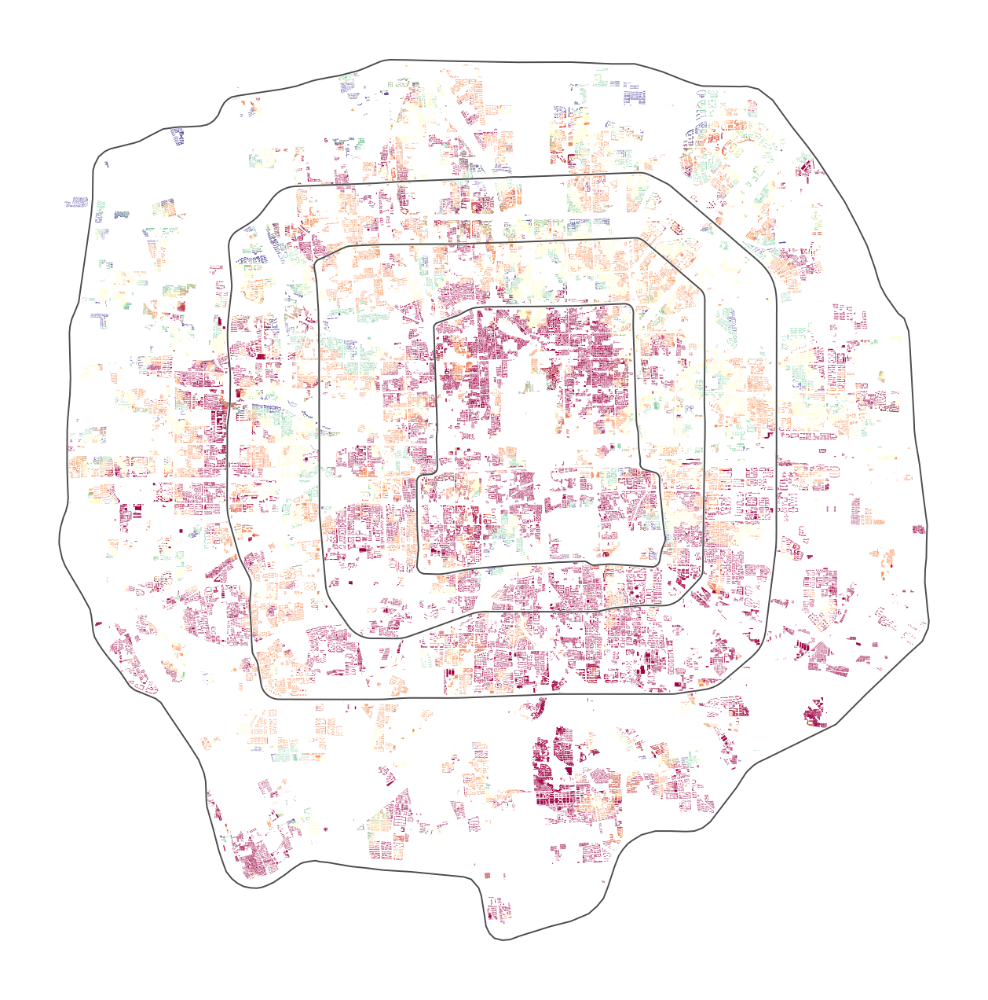

In [63]:
fig, ax = plt.subplots(figsize=(10,8))

lw = 0.7
alpha = 0.7
building_utci.plot(ax=ax, column='SHSR', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=False,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
                  )
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
# center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)

# roads_5r.plot(ax=ax,facecolor='none', edgecolor='k', alpha=0.2, lw=0.1)
# ax.set(xlim=(minx, maxx), ylim=(miny, maxy))
# cx.add_basemap(ax, crs=building_utci.crs,alpha=0.3,
#                   source=cx.providers.MapBox.Streets,zorder=0)

# legend = ax.get_legend()
# legend.set_title("Legend\n($^\circ\mathregular{C}$)",)
# legend._legend_box.align = "left"


# lines = legend.get_lines()
# for line in lines:
#     line.set_marker('s')

# lines = legend.get_texts()
# for line in lines:
#     print(line)
#     rp = line.get_text().replace(', ', ' - ')
#     line.set_text(rp)

# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")
ax.axis('off')

# northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
#                                 sub=8, divd=6
#                                 )

# plt.savefig(f'./SavedFig/02-utci-buildings-SHSR.png', bbox_inches='tight',dpi=300)

## MCHSD

(np.float64(116.18470953985229),
 np.float64(116.56092769838358),
 np.float64(39.743367167787824),
 np.float64(40.03522638681255))

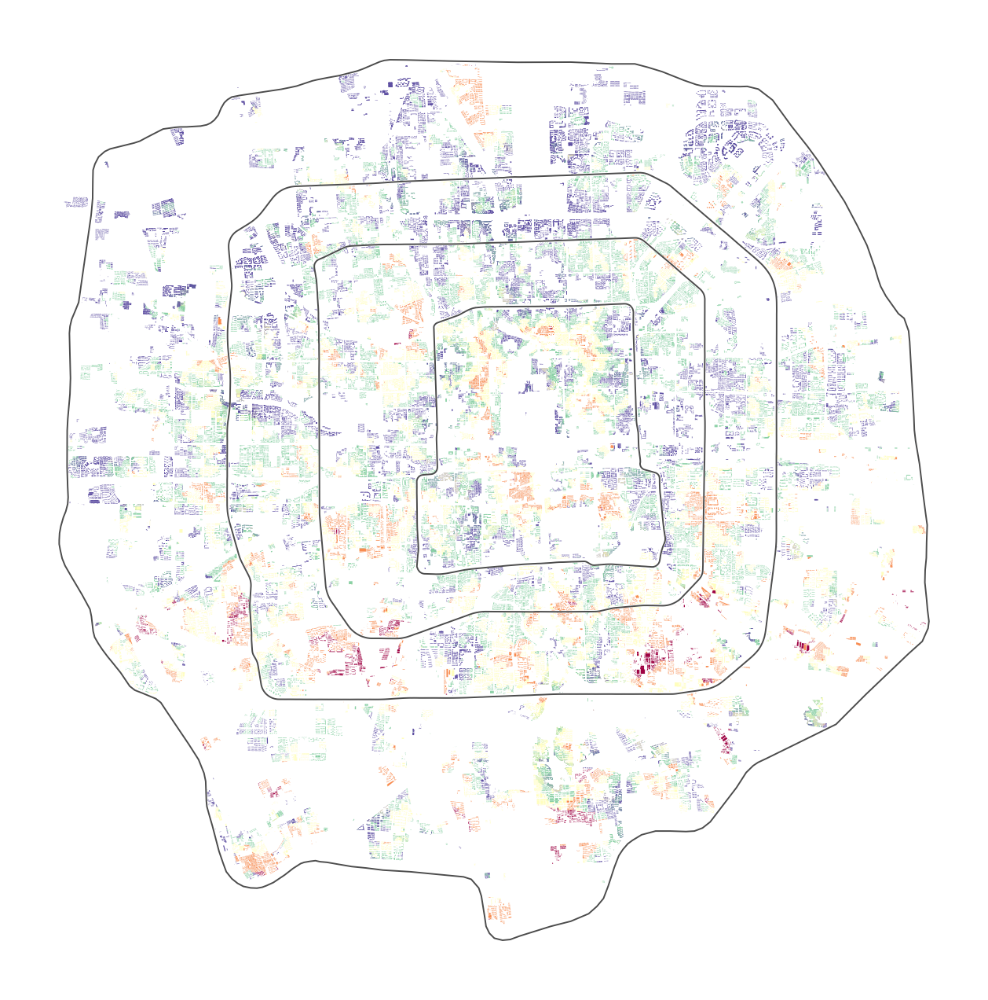

In [64]:
fig, ax = plt.subplots(figsize=(10,8))

lw = 0.7
alpha = 0.7
building_utci.plot(ax=ax, column='MCHSD', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=False,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
                  )
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
# center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)

# roads_5r.plot(ax=ax,facecolor='none', edgecolor='k', alpha=0.2, lw=0.1)
# ax.set(xlim=(minx, maxx), ylim=(miny, maxy))
# cx.add_basemap(ax, crs=building_utci.crs,alpha=0.3,
#                   source=cx.providers.MapBox.Streets,zorder=0)

# legend = ax.get_legend()
# legend.set_title("Legend\n($^\circ\mathregular{C}$)",)
# legend._legend_box.align = "left"


# lines = legend.get_lines()
# for line in lines:
#     line.set_marker('s')

# lines = legend.get_texts()
# for line in lines:
#     print(line)
#     rp = line.get_text().replace(', ', ' - ')
#     line.set_text(rp)

# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")
ax.axis('off')

# northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
#                                 sub=8, divd=6
#                                 )

# plt.savefig(f'./SavedFig/02-utci-buildings-MCHSD.png', bbox_inches='tight',dpi=300)

## CEHL

(np.float64(116.18470953985229),
 np.float64(116.56092769838358),
 np.float64(39.743367167787824),
 np.float64(40.03522638681255))

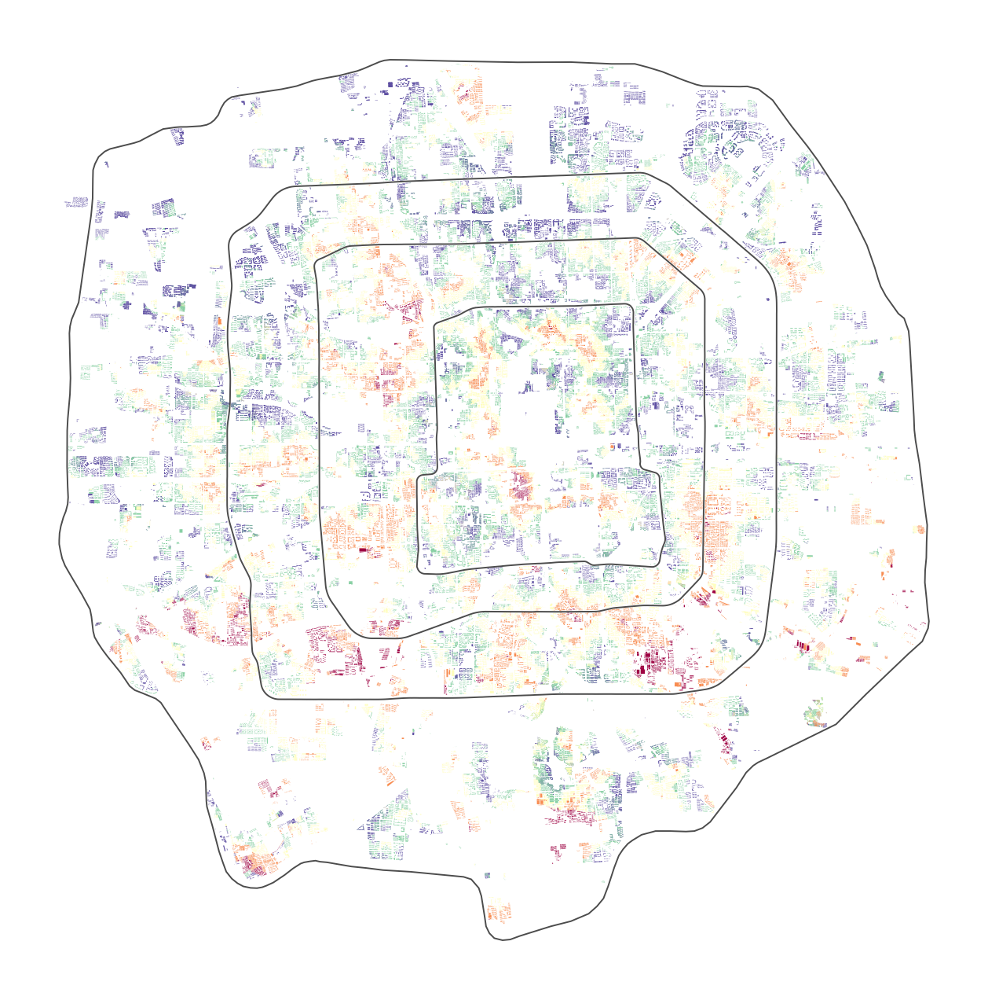

In [65]:
fig, ax = plt.subplots(figsize=(10,8))

lw = 0.7
alpha = 0.7
building_utci.plot(ax=ax, column='CEHL', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=False,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
                  )
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
# center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)

# roads_5r.plot(ax=ax,facecolor='none', edgecolor='k', alpha=0.2, lw=0.1)
# ax.set(xlim=(minx, maxx), ylim=(miny, maxy))
# cx.add_basemap(ax, crs=building_utci.crs,alpha=0.3,
#                   source=cx.providers.MapBox.Streets,zorder=0)

# legend = ax.get_legend()
# legend.set_title("Legend\n($^\circ\mathregular{C}$)",)
# legend._legend_box.align = "left"


# lines = legend.get_lines()
# for line in lines:
#     line.set_marker('s')

# lines = legend.get_texts()
# for line in lines:
#     print(line)
#     rp = line.get_text().replace(', ', ' - ')
#     line.set_text(rp)

# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")
ax.axis('off')

# northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
#                                 sub=8, divd=6
#                                 )

# plt.savefig(f'./SavedFig/02-utci-buildings-CEHL.png', bbox_inches='tight',dpi=300)

In [66]:
building_utci.head(1)

,floors,rid_b,geometry,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration,expo_time
0,2.0,28000,"POLYGON ((116.4254 39.9122, 116.4254 39.91216,...",116.425493,39.912182,474.652818,23,32.872819,1.039166,0.723684,10.36197,3.066667,506.9,366.835526


In [67]:
grid = gpd.read_file('./边界数据/fishnet250.geojson')

In [68]:
grid_df = gpd.sjoin(grid, building_utci, predicate='intersects')

In [69]:
grid_df.head(1)

,net_id,geometry,index_right,floors,rid_b,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration,expo_time
18,18,"POLYGON ((116.3695 39.7611, 116.37242 39.76112...",113341,2.0,9121,116.371943,39.762989,1697.368509,995344,33.598211,0.441053,1.0,53.060617,33.2,1705.7,1705.7


In [70]:
len(grid_df)

182204

In [71]:
grid_df.to_file('./EXPOSURE/buildings_4_indicators.geojson')

In [72]:
grid_HSI = grid_df.groupby(by='net_id')[['HSI']].mean().reset_index()

In [73]:
grid_HSI = grid.merge(grid_HSI, how='left')

In [74]:
grid_HSI

,net_id,geometry,HSI
0,0,"POLYGON ((116.36954 39.7566, 116.37246 39.7566...",NaN
1,1,"POLYGON ((116.37246 39.75661, 116.37538 39.756...",NaN
2,2,"POLYGON ((116.37538 39.75663, 116.37829 39.756...",NaN
3,3,"POLYGON ((116.37829 39.75664, 116.38121 39.756...",NaN
4,4,"POLYGON ((116.38121 39.75666, 116.38413 39.756...",NaN
...,...,...,...
10848,10848,"POLYGON ((116.42573 40.01818, 116.42866 40.018...",NaN
10849,10849,"POLYGON ((116.42866 40.01819, 116.43159 40.018...",NaN
10850,10850,"POLYGON ((116.43159 40.01821, 116.43452 40.018...",NaN
10851,10851,"POLYGON ((116.43452 40.01822, 116.43745 40.018...",NaN


In [75]:
grid_HSV = grid_df.groupby(by='net_id')[['HSV']].mean().reset_index()
grid_HSV = grid.merge(grid_HSV, how='left')

In [76]:
grid_HSV.sort_values(by='HSV')

,net_id,geometry,HSV
5844,5844,"POLYGON ((116.34769 39.90739, 116.35061 39.907...",0.113907
3663,3663,"POLYGON ((116.38609 39.86481, 116.38901 39.864...",0.177266
9637,9637,"POLYGON ((116.49921 39.98473, 116.50214 39.984...",0.181474
2160,2160,"POLYGON ((116.23735 39.83464, 116.24027 39.834...",0.213710
2056,2056,"POLYGON ((116.23445 39.83237, 116.23737 39.832...",0.227908
...,...,...,...
10848,10848,"POLYGON ((116.42573 40.01818, 116.42866 40.018...",NaN
10849,10849,"POLYGON ((116.42866 40.01819, 116.43159 40.018...",NaN
10850,10850,"POLYGON ((116.43159 40.01821, 116.43452 40.018...",NaN
10851,10851,"POLYGON ((116.43452 40.01822, 116.43745 40.018...",NaN


In [77]:
grid_HSI.to_file('./EXPOSURE/grid_HSI.geojson')

# Heat exposure in grid scale

## 平均暴露温度 grid HSI

In [78]:
grid_HSI.head(1)

,net_id,geometry,HSI
0,0,"POLYGON ((116.36954 39.7566, 116.37246 39.7566...",NaN


Text(0, 0, '27.29, 31.57')
Text(0, 0, '31.57, 32.45')
Text(0, 0, '32.45, 33.01')
Text(0, 0, '33.01, 33.44')
Text(0, 0, '33.44, 34.96')


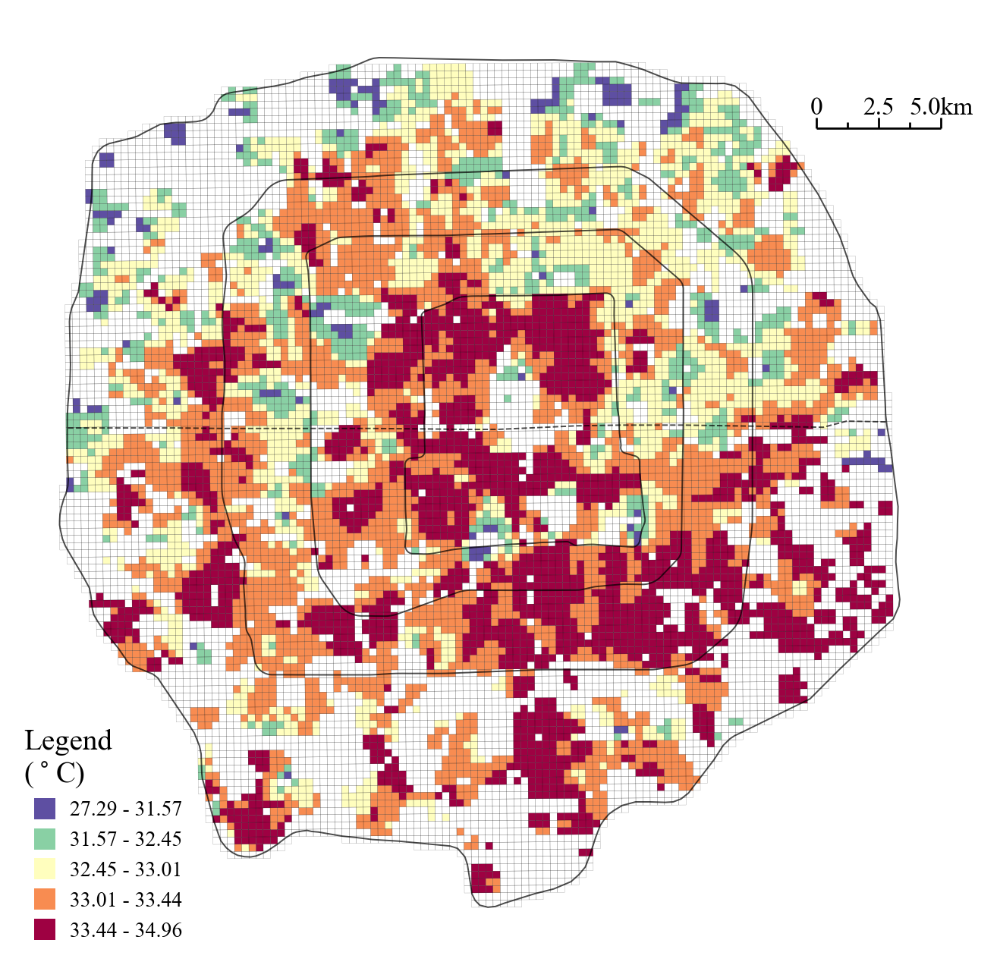

In [79]:
fig, ax = plt.subplots(figsize=(10,8))

from matplotlib.colors import LinearSegmentedColormap 


grid_HSI.plot(ax=ax, column='HSI', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=True,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
               )
grid.plot(ax=ax, edgecolor='k', facecolor='none',alpha=0.5, lw=0.1)
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)
northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
                                sub=8, divd=6
                                )

legend = ax.get_legend()
legend.set_title("Legend\n($^\circ\mathregular{C}$)",)
legend._legend_box.align = "left"
title_obj = legend.get_title()
title_obj.set_fontsize(14)


lines = legend.get_lines()
for line in lines:
    line.set_marker('s')

lines = legend.get_texts()
for line in lines:
    print(line)
    rp = line.get_text().replace(', ', ' - ')
    line.set_text(rp)


# ax.text(116.19,39.735,
#         f"Classification scheme for choropleth map: Natural Breaks")    
ax.axis('off')
# ax.set_title('expo_mean')

plt.savefig(f'./SavedFig/03-utci-HSI.png', bbox_inches='tight',dpi=300)

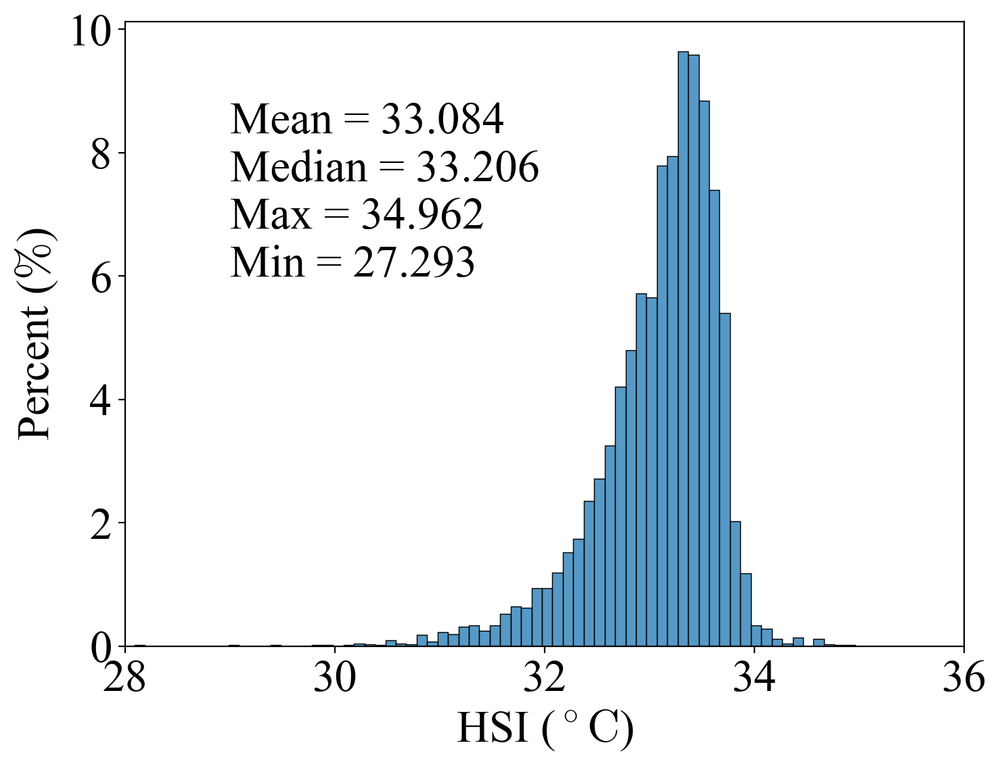

In [80]:
dmean = grid_HSI['HSI'].mean().round(3)
dmedian = grid_HSI['HSI'].median()
dmax = grid_HSI['HSI'].max()
dmin = grid_HSI['HSI'].min()

fig, ax = plt.subplots()
sns.histplot(data=grid_HSI, x='HSI', stat='percent',binwidth=0.1, ax=ax)
ax.set_xlim(28,36)

fontsize = 24
ax.tick_params(axis='both', labelsize=fontsize)  # 设置 X 轴刻度标签的字体大小为 14 点
ax.set_xlabel("HSI ($^\circ\mathrm{C}$)", fontsize=fontsize, math_fontfamily='cm', )
ax.set_ylabel("Percent ($\%$)", fontsize=fontsize, math_fontfamily='cm', )

ax.text(29,6,f'Mean = {dmean:.3f}\nMedian = {dmedian:.3f}\nMax = {dmax:.3f}\nMin = {dmin:.3f}',
        math_fontfamily='cm', fontsize=fontsize )

# plt.savefig(f'./SavedFig/03-utci-HSI-hist.png', bbox_inches='tight',dpi=300)
plt.show()

## 波动压力 HSV

In [81]:
grid_df.head(1)

,net_id,geometry,index_right,floors,rid_b,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration,expo_time
18,18,"POLYGON ((116.3695 39.7611, 116.37242 39.76112...",113341,2.0,9121,116.371943,39.762989,1697.368509,995344,33.598211,0.441053,1.0,53.060617,33.2,1705.7,1705.7


In [82]:
expo_var = grid_df.copy()

In [83]:
expo_var['HSV'] = expo_var['HSV'].apply(lambda x: 1.56 if x> 3.8 else x)

In [84]:
grid_HSV = expo_var.groupby(by='net_id')[['HSV']].mean().reset_index()
grid_HSV = grid.merge(grid_HSV, how='left')

In [85]:
grid_HSV['HSV'].sort_values(ascending=False)

708      2.701170
10622    2.518494
9233     2.444959
9336     2.444959
3659     2.326013
           ...   
10848         NaN
10849         NaN
10850         NaN
10851         NaN
10852         NaN
Name: HSV, Length: 10853, dtype: float64

In [86]:
grid_HSV.to_file('./EXPOSURE/grid_HSV.geojson')

Text(0, 0, '0.11, 0.66')
Text(0, 0, '0.66, 0.91')
Text(0, 0, '0.91, 1.20')
Text(0, 0, '1.20, 1.62')
Text(0, 0, '1.62, 2.70')


(np.float64(116.18372167523498),
 np.float64(116.57849383209445),
 np.float64(39.7433296520367),
 np.float64(40.03522817327689))

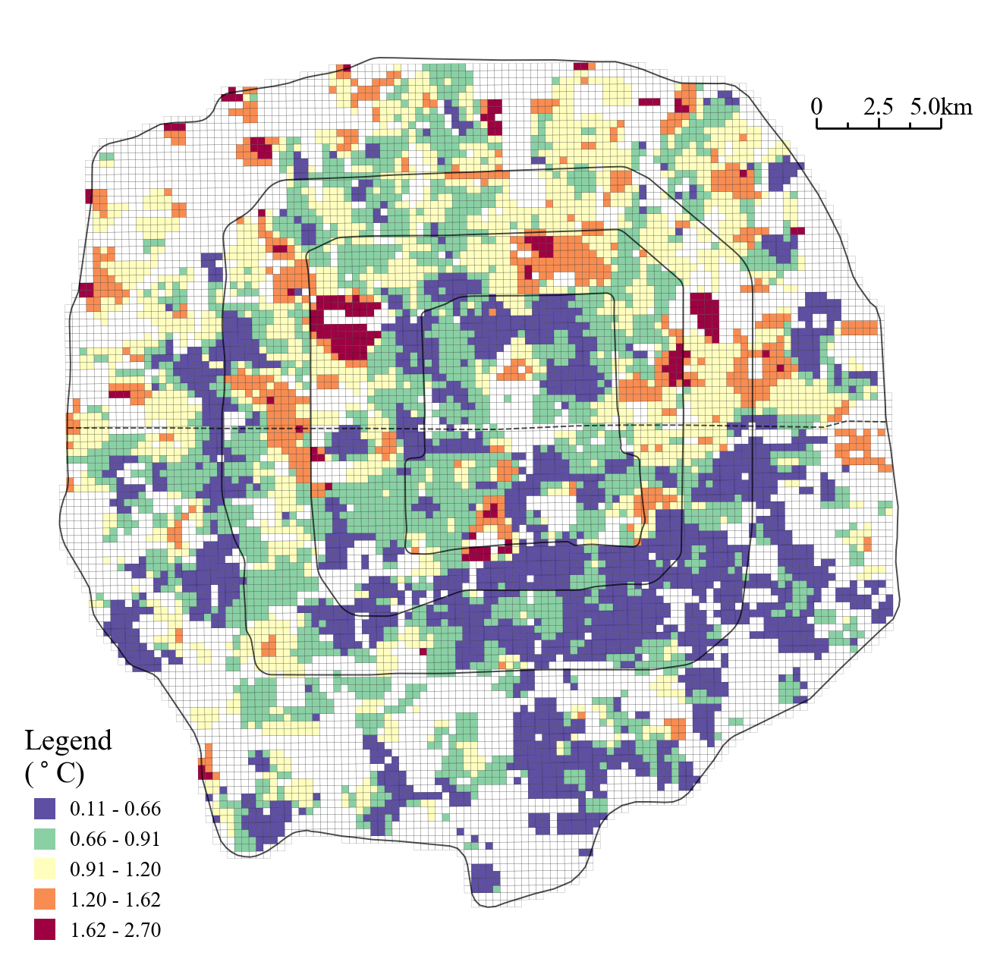

In [87]:
fig, ax = plt.subplots(figsize=(10,8))

from matplotlib.colors import LinearSegmentedColormap 


grid_HSV.plot(ax=ax, column='HSV', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=True,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
               )
grid.plot(ax=ax, edgecolor='k', facecolor='none',alpha=0.5, lw=0.1)
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)
northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
                                sub=8, divd=6
                                )

legend = ax.get_legend()
legend.set_title("Legend\n($^\circ\mathregular{C}$)",)
legend._legend_box.align = "left"
title_obj = legend.get_title()
title_obj.set_fontsize(14)


lines = legend.get_lines()
for line in lines:
    line.set_marker('s')

lines = legend.get_texts()
for line in lines:
    print(line)
    rp = line.get_text().replace(', ', ' - ')
    line.set_text(rp)


# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")    
ax.axis('off')
# ax.set_title('expo_ratio')

# plt.savefig(f'./SavedFig/03-utci-HSV.png', bbox_inches='tight',dpi=300)

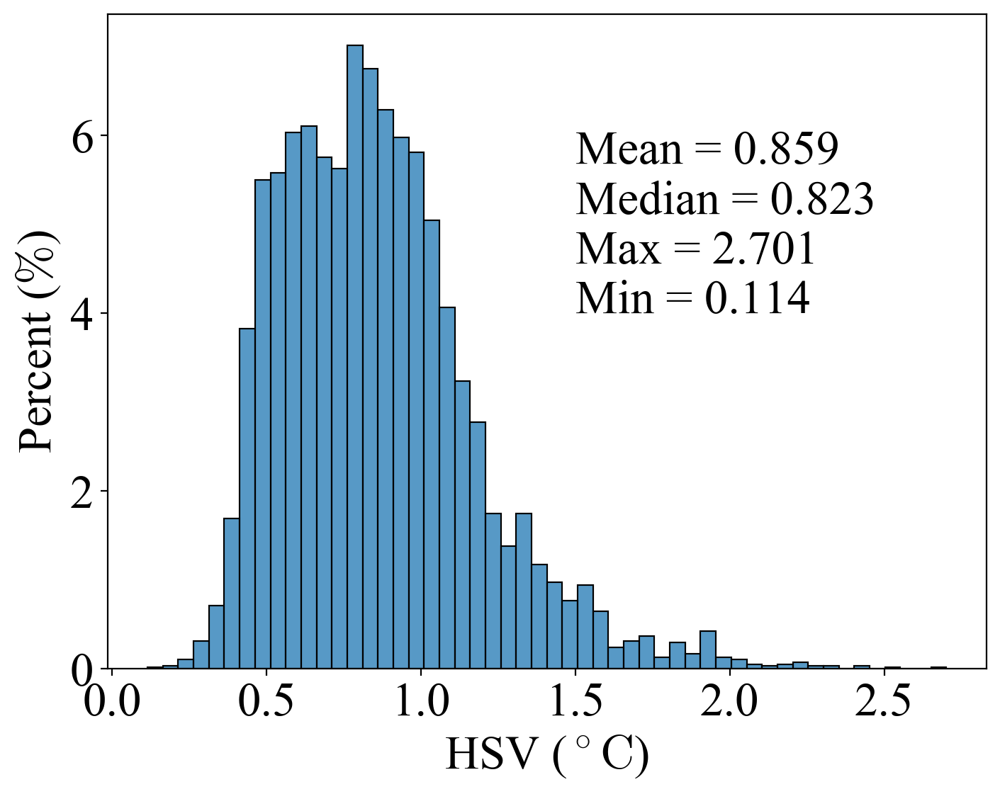

In [88]:
dmean = grid_HSV['HSV'].mean().round(3)
dmedian = grid_HSV['HSV'].median()
dmax = grid_HSV['HSV'].max()
dmin = grid_HSV['HSV'].min()

fig, ax = plt.subplots()
sns.histplot(data=grid_HSV, x='HSV', stat='percent',binwidth=0.05, ax=ax)
# ax.set_xlim(28,36)

fontsize = 24
ax.tick_params(axis='both', labelsize=fontsize)  # 设置 X 轴刻度标签的字体大小为 14 点
ax.set_xlabel("HSV ($^\circ\mathrm{C}$)", fontsize=fontsize, math_fontfamily='cm', )
ax.set_ylabel("Percent ($\%$)", fontsize=fontsize, math_fontfamily='cm', )

ax.text(1.5,4,f'Mean = {dmean:.3f}\nMedian = {dmedian:.3f}\nMax = {dmax:.3f}\nMin = {dmin:.3f}',
        math_fontfamily='cm', fontsize=fontsize )

# plt.savefig(f'./SavedFig/03-utci-HSV-hist.png', bbox_inches='tight',dpi=300)
plt.show()

## 暴露比例grid SHSR

In [89]:
grid_df.head(1)

,net_id,geometry,index_right,floors,rid_b,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration,expo_time
18,18,"POLYGON ((116.3695 39.7611, 116.37242 39.76112...",113341,2.0,9121,116.371943,39.762989,1697.368509,995344,33.598211,0.441053,1.0,53.060617,33.2,1705.7,1705.7


In [90]:
grid_SHSR = grid_df.groupby(by='net_id')[['SHSR']].mean().reset_index()

In [91]:
grid_SHSR = grid.merge(grid_SHSR, how='left')

In [92]:
grid_SHSR['SHSR'].sort_values(ascending=False)

18       1.0
2902     1.0
2888     1.0
2889     1.0
2890     1.0
        ... 
10848    NaN
10849    NaN
10850    NaN
10851    NaN
10852    NaN
Name: SHSR, Length: 10853, dtype: float64

In [93]:
grid_SHSR.to_file('./EXPOSURE/grid_SHSR.geojson')

Text(0, 0, '0.00, 0.43')
Text(0, 0, '0.43, 0.63')
Text(0, 0, '0.63, 0.78')
Text(0, 0, '0.78, 0.91')
Text(0, 0, '0.91, 1.00')


(np.float64(116.18372167523498),
 np.float64(116.57849383209445),
 np.float64(39.7433296520367),
 np.float64(40.03522817327689))

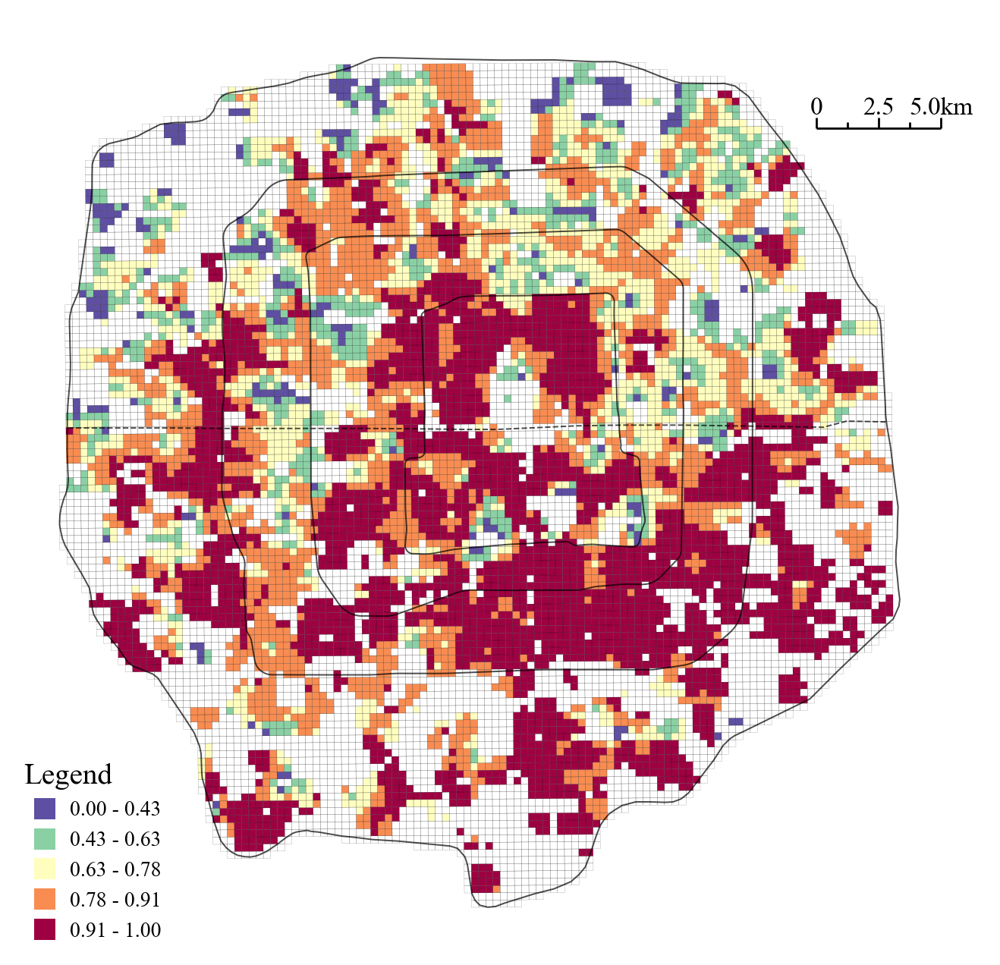

In [94]:
fig, ax = plt.subplots(figsize=(10,8))

from matplotlib.colors import LinearSegmentedColormap 


grid_SHSR.plot(ax=ax, column='SHSR', cmap='Spectral_r',
                   k=5, scheme='naturalbreaks', legend=True,
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
               )
grid.plot(ax=ax, edgecolor='k', facecolor='none',alpha=0.5, lw=0.1)
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)
northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
                                sub=8, divd=6
                                )

legend = ax.get_legend()
legend.set_title("Legend",)
legend._legend_box.align = "left"
title_obj = legend.get_title()
title_obj.set_fontsize(14)


lines = legend.get_lines()
for line in lines:
    line.set_marker('s')

lines = legend.get_texts()
for line in lines:
    print(line)
    rp = line.get_text().replace(', ', ' - ')
    line.set_text(rp)


# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")    
ax.axis('off')
# ax.set_title('expo_ratio')

# plt.savefig(f'./SavedFig/03-utci-SHSR.png', bbox_inches='tight',dpi=300)

In [95]:
grid_SHSR.head(1)

,net_id,geometry,SHSR
0,0,"POLYGON ((116.36954 39.7566, 116.37246 39.7566...",NaN


In [96]:
dmean = grid_SHSR['SHSR'].mean().round(3)
dmedian = grid_SHSR['SHSR'].median()
dmax = grid_SHSR['SHSR'].max()
dmin = grid_SHSR['SHSR'].min()

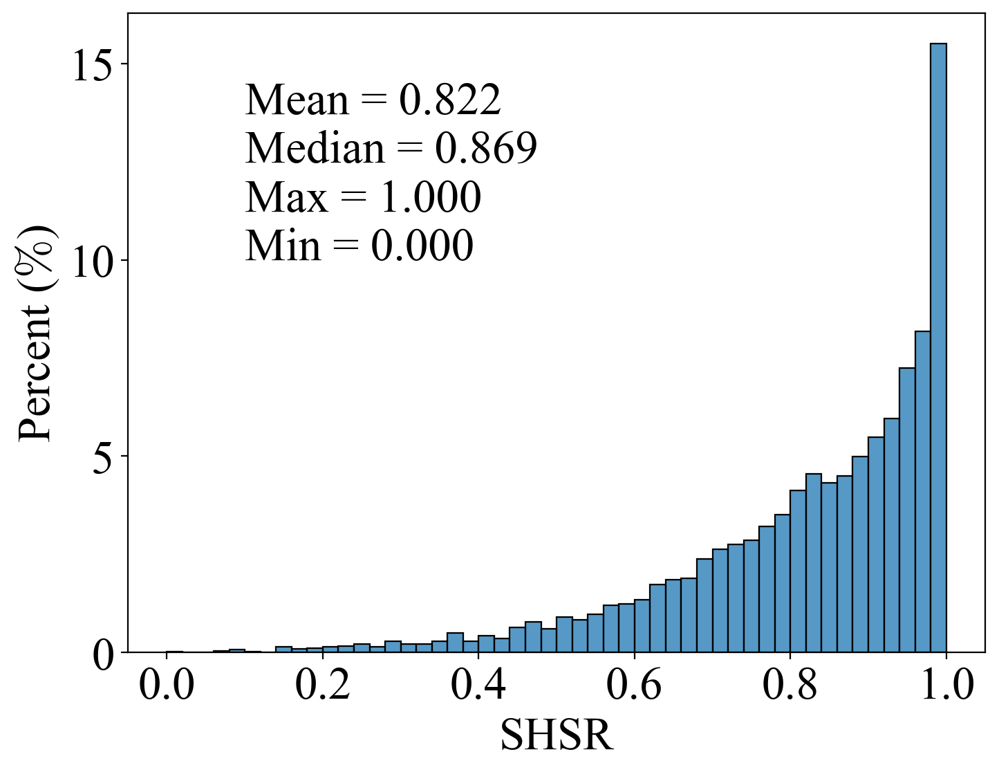

In [97]:
fig, ax = plt.subplots()
sns.histplot(data=grid_SHSR, x='SHSR', stat='percent',binwidth=0.02, ax=ax)
# ax.set_xlim(28,36)

fontsize = 24
ax.tick_params(axis='both', labelsize=fontsize)  # 设置 X 轴刻度标签的字体大小为 14 点
ax.set_xlabel("SHSR", fontsize=fontsize, math_fontfamily='cm', )
ax.set_ylabel("Percent ($\%$)", fontsize=fontsize, math_fontfamily='cm', )

ax.text(0.1,10,f'Mean = {dmean:.3f}\nMedian = {dmedian:.3f}\nMax = {dmax:.3f}\nMin = {dmin:.3f}',
        math_fontfamily='cm', fontsize=fontsize )

# plt.savefig(f'./SavedFig/03-utci-SHSR-hist.png', bbox_inches='tight',dpi=300)
plt.show()

## 极端连续性 MCHSD

In [98]:
grid_df.head(1)

,net_id,geometry,index_right,floors,rid_b,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration,expo_time
18,18,"POLYGON ((116.3695 39.7611, 116.37242 39.76112...",113341,2.0,9121,116.371943,39.762989,1697.368509,995344,33.598211,0.441053,1.0,53.060617,33.2,1705.7,1705.7


In [99]:
grid_df['MCHSD'].sort_values()

7906     0.000000
7906     0.000000
6545     0.000000
6545     0.000000
6545     0.000000
          ...    
3041    78.266667
3042    78.266667
3041    78.266667
3041    78.266667
3158    83.600000
Name: MCHSD, Length: 182204, dtype: float64

In [100]:
# grid_df['MCHSD'] = grid_df['MCHSD'].round(3)

In [101]:
# 这里将高于900的统一设置为900

# grid_df['expo_time'] = grid_df['expo_time'].apply(lambda x: 900 if x>900 else x)

In [102]:
grid_MCHSD = grid_df.groupby(by='net_id')[['MCHSD']].mean().reset_index()

In [103]:
grid_MCHSD = grid.merge(grid_MCHSD, how='left')

In [104]:
grid_MCHSD.to_file('./EXPOSURE/grid_MCHSD.geojson')

(np.float64(116.18372167523498),
 np.float64(116.57849383209445),
 np.float64(39.7433296520367),
 np.float64(40.03522817327689))

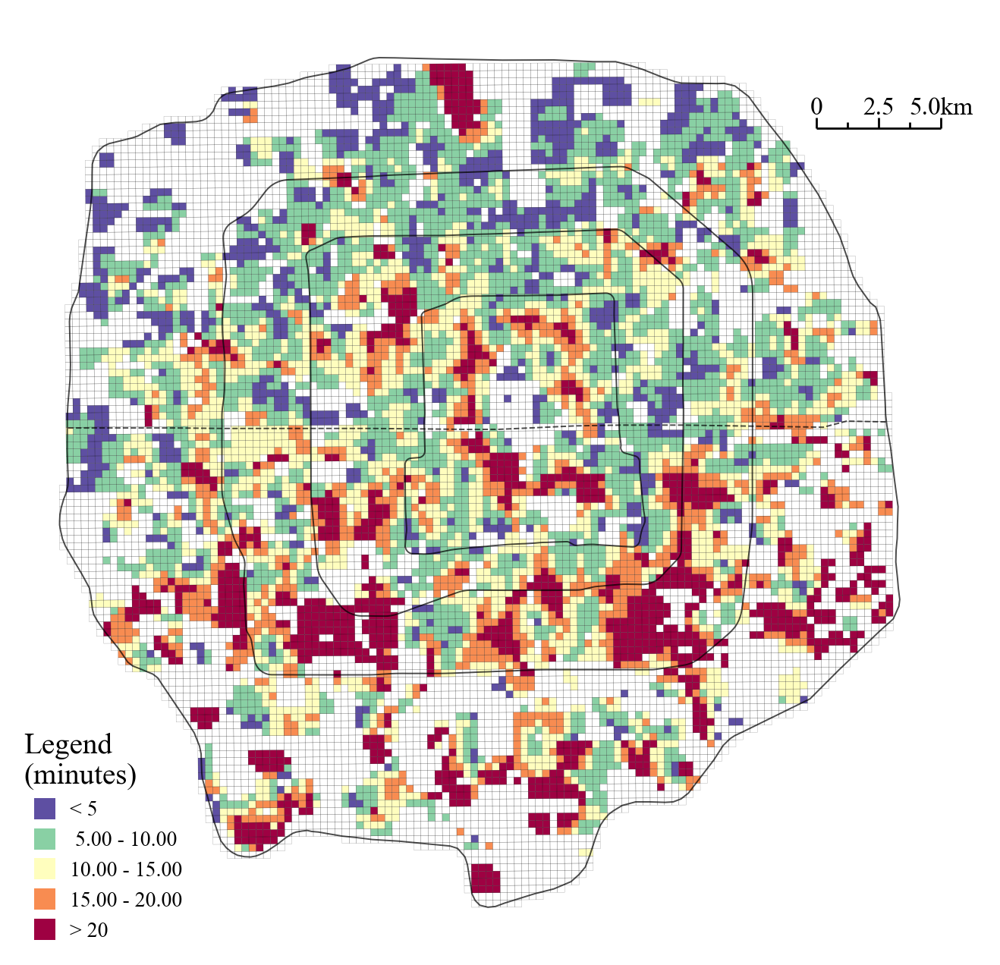

In [105]:
fig, ax = plt.subplots(figsize=(10,8))

from matplotlib.colors import LinearSegmentedColormap 

my_bins = [5, 10, 15, 20]
grid_MCHSD.plot(ax=ax, column='MCHSD', cmap='Spectral_r',
                   k=5, scheme='UserDefined', legend=True,
                   classification_kwds={'bins': my_bins}, # 传入你的自定义断点
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2},  # 0.72
               )
grid.plot(ax=ax, edgecolor='k', facecolor='none',alpha=0.5, lw=0.1)
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)
northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
                                sub=8, divd=6
                                )

legend = ax.get_legend()
legend.set_title("Legend\n(minutes)",)
legend._legend_box.align = "left"
title_obj = legend.get_title()
title_obj.set_fontsize(14)

lines = legend.get_lines()
for line in lines:
    line.set_marker('s')

lines = legend.get_texts()
for idx,line in enumerate(lines):
    if idx == 0:
        line.set_text("< 5")
    elif idx == 4:
        line.set_text("> 20")
    else:
        rp = line.get_text().replace(', ', ' - ')
        line.set_text(rp)


# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")    
ax.axis('off')
# ax.set_title('expo_time')

# plt.savefig(f'./SavedFig/03-utci-MCHSD.png', bbox_inches='tight',dpi=300)

In [106]:
dmean = grid_MCHSD['MCHSD'].mean().round(3)
dmedian = grid_MCHSD['MCHSD'].median()
dmax = grid_MCHSD['MCHSD'].max()
dmin = grid_MCHSD['MCHSD'].min()
dmin = 1

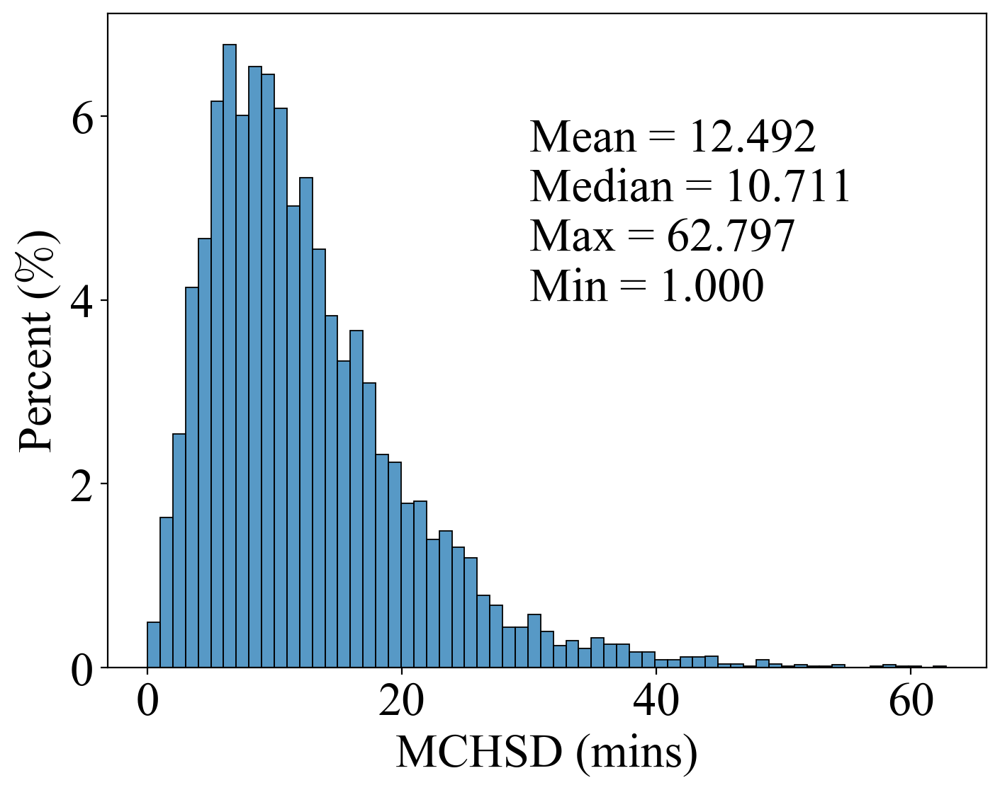

In [107]:
fig, ax = plt.subplots()
sns.histplot(data=grid_MCHSD, x='MCHSD', stat='percent',binwidth=1, ax=ax)
# ax.set_xlim(28,36)

fontsize = 24
ax.tick_params(axis='both', labelsize=fontsize)  # 设置 X 轴刻度标签的字体大小为 14 点
ax.set_xlabel("MCHSD (mins)", fontsize=fontsize, math_fontfamily='cm', )
ax.set_ylabel("Percent ($\%$)", fontsize=fontsize, math_fontfamily='cm', )

ax.text(30,4,f'Mean = {dmean:.3f}\nMedian = {dmedian:.3f}\nMax = {dmax:.3f}\nMin = {dmin:.3f}',
        math_fontfamily='cm', fontsize=fontsize )

# plt.savefig(f'./SavedFig/03-utci-MCHSD-hist.png', bbox_inches='tight',dpi=300)
plt.show()

## 累积生理债 CEHL

In [108]:
grid_df.head(1)

,net_id,geometry,index_right,floors,rid_b,building_lng,building_lat,distance,od_id,HSI,HSV,SHSR,CEHL,MCHSD,duration,expo_time
18,18,"POLYGON ((116.3695 39.7611, 116.37242 39.76112...",113341,2.0,9121,116.371943,39.762989,1697.368509,995344,33.598211,0.441053,1.0,53.060617,33.2,1705.7,1705.7


In [109]:
grid_CEHL = grid_df.groupby(by='net_id')[['CEHL']].mean().reset_index()

In [110]:
grid_CEHL = grid.merge(grid_CEHL, how='left')

In [111]:
grid_CEHL['CEHL'].sort_values(ascending=False)

618      114.552426
3042     113.260364
550      107.806175
617      106.778032
549      106.767155
            ...    
10848           NaN
10849           NaN
10850           NaN
10851           NaN
10852           NaN
Name: CEHL, Length: 10853, dtype: float64

In [112]:
grid_CEHL.to_file('./EXPOSURE/grid_CEHL.geojson')

(np.float64(116.18372167523498),
 np.float64(116.57849383209445),
 np.float64(39.7433296520367),
 np.float64(40.03522817327689))

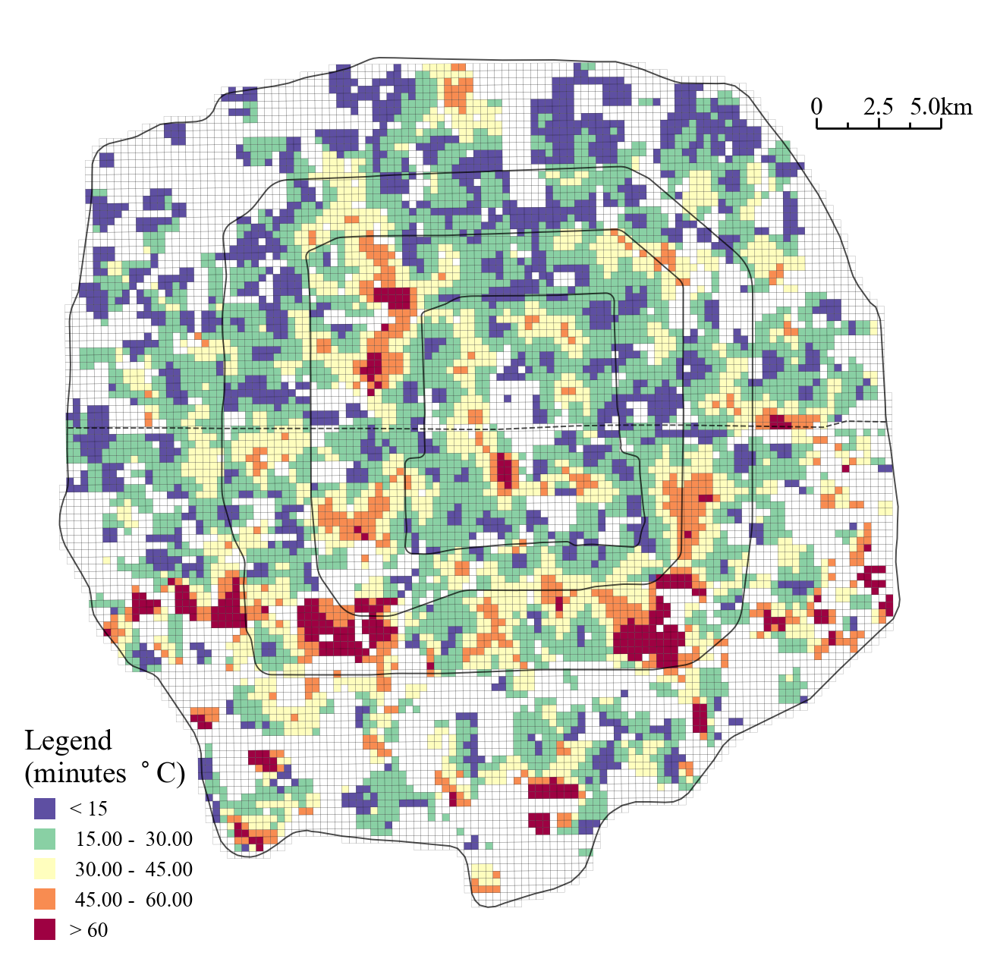

In [113]:
fig, ax = plt.subplots(figsize=(10,8))

from matplotlib.colors import LinearSegmentedColormap 

my_bins = [15, 30, 45, 60]
grid_CEHL.plot(ax=ax, column='CEHL', cmap='Spectral_r',
                   k=5, scheme='UserDefined', legend=True,
                   classification_kwds={'bins': my_bins}, # 传入你的自定义断点
                   legend_kwds={'loc':(0,0),'frameon':False,'fontsize':10,"handletextpad":0.2}, 
               )
grid.plot(ax=ax, edgecolor='k', facecolor='none',alpha=0.5, lw=0.1)
# parks.plot(ax=ax,facecolor='green', edgecolor='none', alpha=0.6)
region.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring2.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring3.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
ring4.plot(ax=ax,facecolor='none', edgecolor='k', alpha=alpha, lw=lw)
center_l.plot(ax=ax,edgecolor='k', ls='--',alpha=alpha, lw=lw)
northarrow_new.add_scalebar_geo2(gdf_geo=region, length=2500, lng=116.51, lat=40, ax=ax,
                                sub=8, divd=6
                                )

legend = ax.get_legend()
legend.set_title("Legend\n(minutes $^\circ\mathregular{C}$)",)
legend._legend_box.align = "left"
title_obj = legend.get_title()
title_obj.set_fontsize(14)

lines = legend.get_lines()
for line in lines:
    line.set_marker('s')

lines = legend.get_texts()
for idx,line in enumerate(lines):
    if idx == 0:
        line.set_text("< 15")
    elif idx == 4:
        line.set_text("> 60")
    else:
        rp = line.get_text().replace(', ', ' - ')
        line.set_text(rp)


# ax.text(116.19,39.735,
#         "Classification scheme for choropleth map: Natural Breaks")    
ax.axis('off')
# ax.set_title('expo_ratio')

# plt.savefig(f'./SavedFig/03-utci-CEHL.png', bbox_inches='tight',dpi=300)

In [114]:
dmean = grid_CEHL['CEHL'].mean().round(3)
dmedian = grid_CEHL['CEHL'].median()
dmax = grid_CEHL['CEHL'].max()
dmin = grid_CEHL['CEHL'].min()

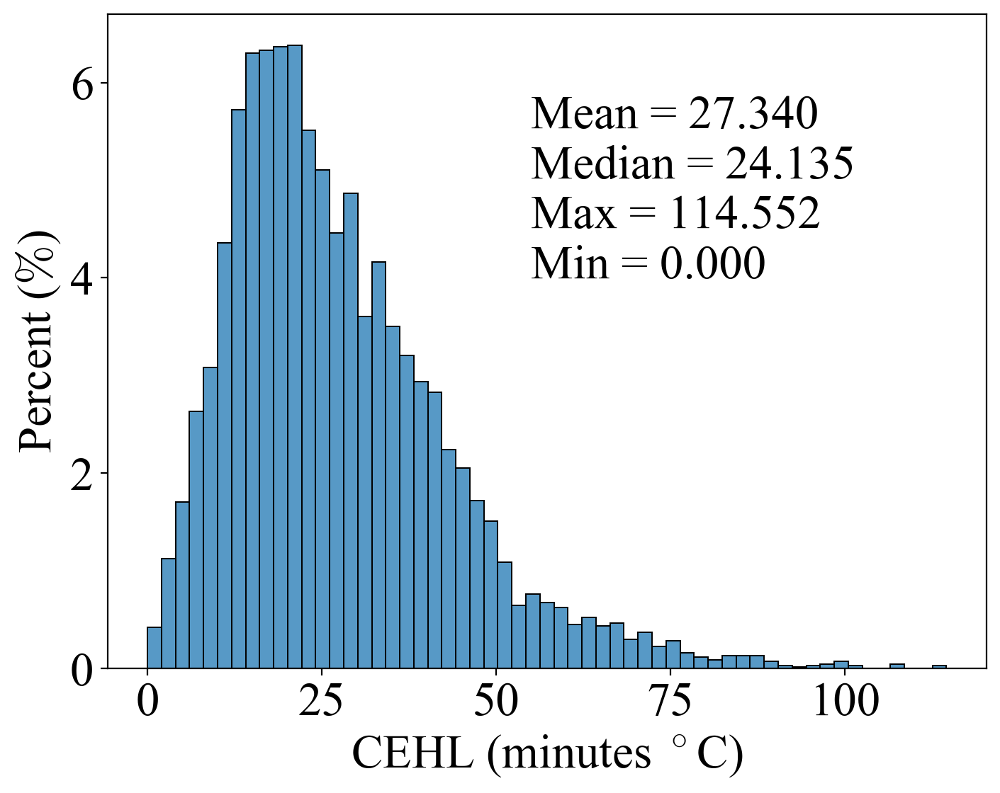

In [115]:
fig, ax = plt.subplots()
sns.histplot(data=grid_CEHL, x='CEHL', stat='percent',binwidth=2, ax=ax)
# ax.set_xlim(28,36)

fontsize = 24
ax.tick_params(axis='both', labelsize=fontsize)  # 设置 X 轴刻度标签的字体大小为 14 点
ax.set_xlabel("CEHL (minutes $^\circ\mathregular{C}$)", fontsize=fontsize, math_fontfamily='cm', )
ax.set_ylabel("Percent ($\%$)", fontsize=fontsize, math_fontfamily='cm', )

ax.text(55,4,f'Mean = {dmean:.3f}\nMedian = {dmedian:.3f}\nMax = {dmax:.3f}\nMin = {dmin:.3f}',
        math_fontfamily='cm', fontsize=fontsize )

# plt.savefig(f'./SavedFig/03-utci-CEHL-hist.png', bbox_inches='tight',dpi=300)
plt.show()

# save

In [116]:
len(grid_HSV), len(grid_HSI), len(grid_SHSR), len(grid_MCHSD), len(grid_CEHL)

(10853, 10853, 10853, 10853, 10853)

In [117]:
grid_CEHL

,net_id,geometry,CEHL
0,0,"POLYGON ((116.36954 39.7566, 116.37246 39.7566...",NaN
1,1,"POLYGON ((116.37246 39.75661, 116.37538 39.756...",NaN
2,2,"POLYGON ((116.37538 39.75663, 116.37829 39.756...",NaN
3,3,"POLYGON ((116.37829 39.75664, 116.38121 39.756...",NaN
4,4,"POLYGON ((116.38121 39.75666, 116.38413 39.756...",NaN
...,...,...,...
10848,10848,"POLYGON ((116.42573 40.01818, 116.42866 40.018...",NaN
10849,10849,"POLYGON ((116.42866 40.01819, 116.43159 40.018...",NaN
10850,10850,"POLYGON ((116.43159 40.01821, 116.43452 40.018...",NaN
10851,10851,"POLYGON ((116.43452 40.01822, 116.43745 40.018...",NaN


# statstic

In [118]:
result = grid_HSV[['net_id','HSV']].\
merge(grid_HSI[['net_id','HSI']]).\
merge(grid_SHSR[['net_id','SHSR']]).\
merge(grid_MCHSD[['net_id','MCHSD']]).\
merge(grid_CEHL[['net_id','CEHL']])

In [119]:
result

,net_id,HSV,HSI,SHSR,MCHSD,CEHL
0,0,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
10848,10848,NaN,NaN,NaN,NaN,NaN
10849,10849,NaN,NaN,NaN,NaN,NaN
10850,10850,NaN,NaN,NaN,NaN,NaN
10851,10851,NaN,NaN,NaN,NaN,NaN


In [120]:
rg = gpd.read_file('./EXPOSURE/final_many_idx.geojson')

In [121]:
# rg.columns

In [122]:
result = rg[['net_id','Id','总人口',
       '0-14', '15-59', '60以上', '65以上', '均价', '建筑年代2','geometry']].merge(result)

In [123]:
type(result)

geopandas.geodataframe.GeoDataFrame

In [124]:
region = './边界数据/研究区/五环_ns.shp'
region = gpd.read_file(region)

In [125]:
region

,label,geometry
0,S,"POLYGON ((116.20493 39.90586, 116.21222 39.906..."
1,N,"POLYGON ((116.53832 39.90879, 116.52233 39.908..."


In [126]:
rg2 = gpd.sjoin(result, region, predicate='intersects',how='left').drop("index_right", axis=1)
# rg2

In [127]:
rg2.columns

Index(['net_id', 'Id', '总人口', '0-14', '15-59', '60以上', '65以上', '均价', '建筑年代2',
       'geometry', 'HSV', 'HSI', 'SHSR', 'MCHSD', 'CEHL', 'label'],
      dtype='object')

In [128]:
rg2.head(1)

,net_id,Id,总人口,0-14,15-59,60以上,65以上,均价,建筑年代2,geometry,HSV,HSI,SHSR,MCHSD,CEHL,label
0,33,5ring,837.051829,100.615946,544.191633,190.950479,132.33866,31686.0,1994.0,"POLYGON ((116.3724 39.76337, 116.37532 39.7633...",0.476777,33.53758,0.979802,26.788571,44.139093,S


In [129]:
rg2.to_file('./EXPOSURE/final_many_idx.geojson')

In [130]:
res = rg2.groupby(by=['Id'])[['HSI', 'HSV', 'SHSR', 'MCHSD', 'CEHL',]].\
agg(['mean','median']).round(3)
res

HSI            HSV          SHSR          MCHSD            CEHL  \
         mean  median   mean median   mean median    mean  median    mean   
Id                                                                          
2ring  33.430  33.501  0.757  0.735  0.895  0.940  11.963  10.838  25.166   
3ring  33.150  33.242  0.892  0.843  0.840  0.857  11.669  10.689  28.351   
4ring  32.987  33.003  0.957  0.906  0.788  0.796  11.104  10.387  26.749   
5ring  33.049  33.168  0.831  0.819  0.823  0.860  10.993  10.049  23.998   

               
       median  
Id             
2ring  22.962  
3ring  25.178  
4ring  23.950  
5ring  21.500

In [131]:
res.to_excel('./Table/stat_indicators-rings.xlsx')

In [132]:
res2 = rg2.groupby(by=['label'])[['HSI', 'HSV', 'SHSR', 'MCHSD', 'CEHL',]].\
agg(['mean','median']).round(3)
res2

HSI            HSV          SHSR          MCHSD            CEHL  \
         mean  median   mean median   mean median    mean  median    mean   
label                                                                       
N      33.005  33.067  0.941  0.906  0.792  0.812  10.017   9.552  23.816   
S      33.300  33.373  0.768  0.734  0.885  0.922  13.286  11.994  29.327   

               
       median  
label          
N      21.712  
S      26.687

In [133]:
res2.to_excel('./Table/stat_indicators-ns.xlsx')

In [134]:
mean_data = rg2[['HSI', 'HSV', 'SHSR', 'MCHSD', 'CEHL',]].mean().round(3)
mean_data

HSI      33.128
HSV       0.869
SHSR      0.831
MCHSD    11.376
CEHL     26.107
dtype: float64

In [135]:
median_data = rg2[['HSI', 'HSV', 'SHSR', 'MCHSD', 'CEHL',]].median().round(3)
median_data

HSI      33.207
HSV       0.831
SHSR      0.860
MCHSD    10.481
CEHL     23.716
dtype: float64